In [76]:
import ants
import os
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

In [11]:
bids_dir = '~/data/ABIDE/Derivatives/fmriprep3/'
bids_dir = os.path.expanduser(bids_dir)

In [12]:
subs = [sub for sub in os.listdir(bids_dir) if sub.startswith('sub-') and not sub.endswith('.html')]
subs.sort()

In [83]:
df = pd.read_csv('../Data/ABIDE_df3.csv')
df

,Unnamed: 0,participant_id,DX_GROUP,DSM_IV_TR,AGE_AT_SCAN,SEX,HANDEDNESS_CATEGORY,HANDEDNESS_SCORES,FIQ,VIQ,...,WISC_IV_DIGIT_SPAN_SCALED,WISC_IV_LET_NUM_SCALED,WISC_IV_CODING_SCALED,WISC_IV_SYM_SCALED,EYE_STATUS_AT_SCAN,AGE_AT_MPRAGE,BMI,bids_folder,site,funcFile
0,0,50002,1,1.0,16.77,1,Ambi,NaN,103.0,116.0,...,NaN,NaN,NaN,NaN,2,NaN,NaN,sub-Pitt0050002,13,Pitt_0050002_func_preproc.nii.gz
1,1,50003,1,1.0,24.45,1,R,NaN,124.0,128.0,...,NaN,NaN,NaN,NaN,2,NaN,NaN,sub-Pitt0050003,13,Pitt_0050003_func_preproc.nii.gz
2,2,50004,1,1.0,19.09,1,R,NaN,113.0,108.0,...,NaN,NaN,NaN,NaN,2,NaN,NaN,sub-Pitt0050004,13,Pitt_0050004_func_preproc.nii.gz
3,3,50005,1,1.0,13.73,2,R,NaN,119.0,117.0,...,NaN,NaN,NaN,NaN,2,NaN,NaN,sub-Pitt0050005,13,Pitt_0050005_func_preproc.nii.gz
4,4,50006,1,1.0,13.37,1,L,NaN,109.0,99.0,...,NaN,NaN,NaN,NaN,2,NaN,NaN,sub-Pitt0050006,13,Pitt_0050006_func_preproc.nii.gz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,1043,51583,1,2.0,35.00,1,NaN,100.0,95.0,105.0,...,NaN,NaN,NaN,NaN,2,NaN,NaN,sub-SBL0051583,14,SBL_0051583_func_preproc.nii.gz
1044,1044,51584,1,2.0,49.00,1,NaN,100.0,NaN,133.0,...,NaN,NaN,NaN,NaN,2,NaN,23.24,sub-SBL0051584,14,SBL_0051584_func_preproc.nii.gz
1045,1045,51585,1,1.0,27.00,1,NaN,90.0,96.0,99.0,...,NaN,NaN,NaN,NaN,2,NaN,NaN,sub-SBL0051585,14,SBL_0051585_func_preproc.nii.gz
1046,1046,51606,1,2.0,29.00,2,R,NaN,118.0,NaN,...,NaN,NaN,NaN,NaN,2,NaN,NaN,sub-MaxMuna0051606,6,MaxMun_a_0051606_func_preproc.nii.gz


In [92]:
df_tc = df.iloc[df['DX_GROUP'].values==1]

In [93]:
subs = df_tc['participant_id'].values

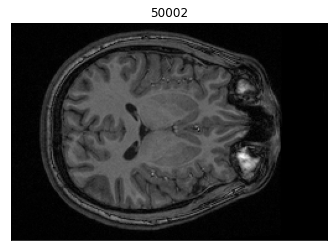

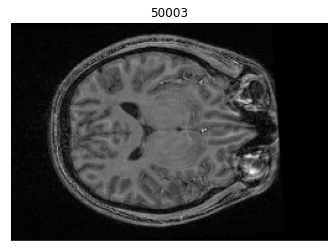

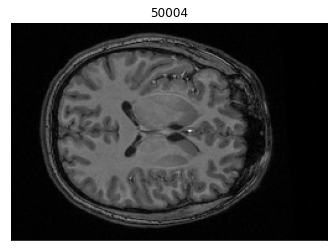

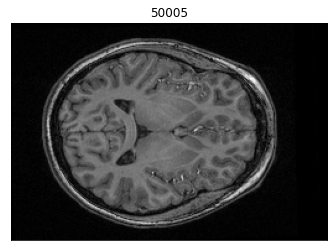

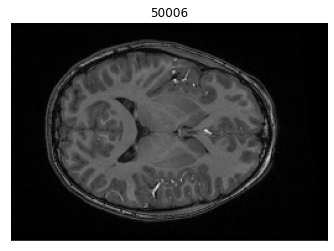

...

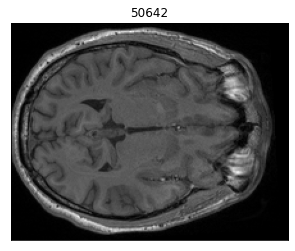

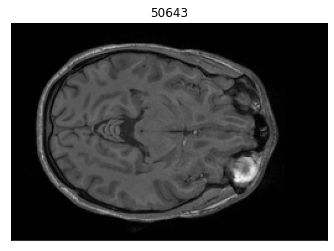

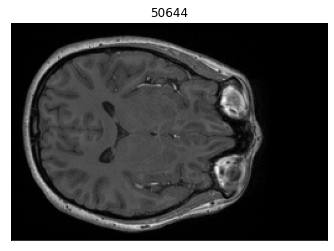

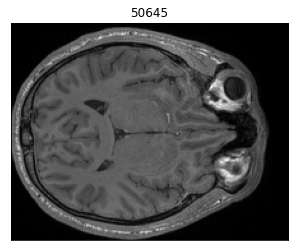

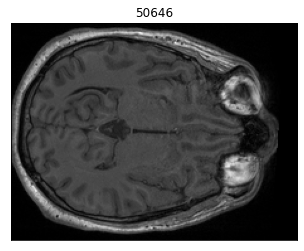

In [94]:
for s in range(250):
    sub = str(subs[s])
    
    t1_fn = 'sub-00{sub}_desc-preproc_T1w.nii.gz'.format(sub=sub)
    gm_fn = 'sub-00{sub}_label-GM_probseg.nii.gz'.format(sub=sub)
    wm_fn = 'sub-00{sub}_label-WM_probseg.nii.gz'.format(sub=sub)

    t1 = ants.image_read(os.path.join(bids_dir,f'sub-00{sub}','anat',t1_fn))
    gm = ants.image_read(os.path.join(bids_dir,f'sub-00{sub}','anat',gm_fn))
    wm = ants.image_read(os.path.join(bids_dir,f'sub-00{sub}','anat',wm_fn))
    #brain = gm+wm
    #t1[brain<.9] = 0

    mid = np.argmax(t1.numpy().sum(axis=0).sum(axis=0))
    mat = t1.numpy()[:,:,mid]
    #mat[mat<10] = np.nan
    plt.figure()
    plt.imshow(mat,cmap='gray')
    plt.xticks([]);
    plt.yticks([]);
    plt.title(sub);
    plt.show()